# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

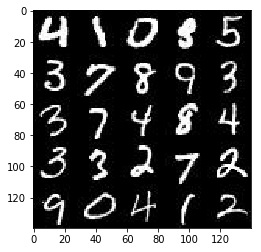

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

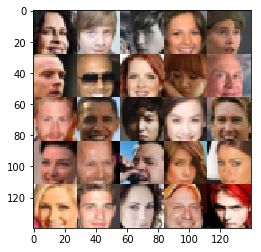

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """

    image_placeholder = tf.placeholder(tf.float32, (None, image_height, image_width, image_channels), name="input_images")
    z_data_placeholder = tf.placeholder(tf.float32, (None, z_dim), name="z_data")
    learning_rate_placeholder = tf.placeholder(tf.float32, (), name="learning_rate")

    return image_placeholder, z_data_placeholder, learning_rate_placeholder


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.1):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    
    with tf.variable_scope("discriminator", reuse=reuse):
       
        # 5x5 convolution, 64 filters, 2x2 strides
        layer_1 = tf.layers.conv2d(images, 
                                   64, 
                                   kernel_size=5, 
                                   strides=(2,2), 
                                   padding="same", 
                                   kernel_initializer=tf.random_normal_initializer(stddev=0.02),
                                   kernel_regularizer=tf.contrib.layers.l2_regularizer(0.03)
                                  )
        layer_1_af = tf.maximum(alpha * layer_1, layer_1)
        
        # 5x5 convolution, 128 filters, 2x2 strides
        layer_2 = tf.layers.conv2d(layer_1_af, 
                                   128,
                                   kernel_size=5, 
                                   strides=(2,2), 
                                   padding="same", 
                                   kernel_initializer=tf.random_normal_initializer(stddev=0.02),
                                   kernel_regularizer=tf.contrib.layers.l2_regularizer(0.03)
                                  )
        layer_2_bn = tf.layers.batch_normalization(layer_2, training=True)
        layer_2_af = tf.maximum(alpha * layer_2_bn, layer_2_bn)

        # 5x5 convolution, 256 filters, 2x2 strides
        layer_3 = tf.layers.conv2d(layer_2_af, 
                                   256,
                                   kernel_size=5, 
                                   strides=(2,2), 
                                   padding="same", 
                                   kernel_initializer=tf.random_normal_initializer(stddev=0.02),
                                   kernel_regularizer=tf.contrib.layers.l2_regularizer(0.03)
                                  )
        layer_3_bn = tf.layers.batch_normalization(layer_3, training=True)
        layer_3_af = tf.maximum(alpha * layer_3_bn, layer_3_bn)
        
        # flatten layer
        layer_4 = tf.reshape(layer_3_af, (-1, 4096))
        logits = tf.layers.dense(layer_4, 1)
        output = tf.sigmoid(logits)
        
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.1):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope("generator", reuse=not is_train):
        # flat noise
        layer_1 = tf.layers.dense(z, 12544)
        layer_1_rs = tf.reshape(layer_1, (-1, 7, 7, 256))
        layer_1_af = tf.maximum(alpha * layer_1_rs, layer_1_rs)
    
        # 5x5 transposed convolution, 128 filters, 2x2 strides
        layer_2 = tf.layers.conv2d_transpose(layer_1_af, 
                                             128, 
                                             kernel_size=5, 
                                             strides=(2, 2),
                                             padding="same",
                                             kernel_initializer=tf.random_normal_initializer(stddev=0.02),
                                             kernel_regularizer=tf.contrib.layers.l2_regularizer(0.03)
                                            )
        layer_2_bn = tf.layers.batch_normalization(layer_2, training=is_train)
        layer_2_af = tf.maximum(alpha * layer_2_bn, layer_2_bn)
    
        # 5x5 transposed convolution, 64 filters, 2x2 strides
        layer_3 = tf.layers.conv2d_transpose(layer_2_af, 
                                             64, 
                                             kernel_size=5, 
                                             strides=(2, 2),
                                             padding="same",
                                             kernel_initializer=tf.random_normal_initializer(stddev=0.02),
                                             kernel_regularizer=tf.contrib.layers.l2_regularizer(0.03)
                                            )
        layer_3_bn = tf.layers.batch_normalization(layer_3, training=is_train)
        layer_3_af = tf.maximum(alpha * layer_3_bn, layer_3_bn)
        
        # output
        logits = tf.layers.conv2d_transpose(layer_3_af,
                                            out_channel_dim,
                                            kernel_size=5,
                                            padding="same",
                                            strides=(1, 1),
                                            kernel_initializer=tf.random_normal_initializer(stddev=0.02)
                                           )
        
        output = tf.tanh(logits)
    
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    smooth = 0.1  # one-sided label smoothing, reducing discriminator strength, improving generalization
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1.0 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """

#     saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
    samples, losses = [], []
    alpha = 0.2

    input_images, z_data, learning_rate_ph = model_inputs(data_shape[2], data_shape[1], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_images, z_data, data_shape[3], alpha=alpha)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate_ph, beta1)
    
    print_every=100
    show_every=300
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                batch_images *= 2.0  # normalize tanh to (-1, 1) (from (-0.5, -.5))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_images: batch_images, z_data: batch_z, learning_rate_ph: learning_rate})
                _ = sess.run(g_opt, feed_dict={z_data: batch_z, input_images: batch_images, learning_rate_ph: learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({z_data: batch_z, input_images: batch_images})
                    train_loss_g = g_loss.eval({z_data: batch_z})

                    print("Epoch {}/{}...".format(epoch_i + 1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(z_data, data_shape[3], is_train=False),
                                   feed_dict={z_data: sample_z})
                    samples.append(gen_samples)
                    show_generator_output(sess, 25, z_data, data_shape[3], data_image_mode)

#         saver.save(sess, './checkpoints/generator.ckpt')

#     with open('samples.pkl', 'wb') as f:
#         pkl.dump(samples, f)
    
    return losses, samples                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/5... Discriminator Loss: 1.3902... Generator Loss: 0.6776
Epoch 1/5... Discriminator Loss: 1.4497... Generator Loss: 0.6489
Epoch 1/5... Discriminator Loss: 1.5497... Generator Loss: 1.1513


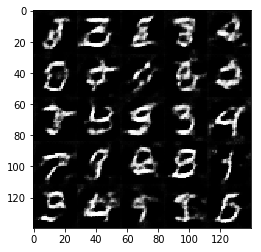

Epoch 1/5... Discriminator Loss: 1.4315... Generator Loss: 0.9531
Epoch 1/5... Discriminator Loss: 1.4646... Generator Loss: 0.4516
Epoch 1/5... Discriminator Loss: 1.1450... Generator Loss: 1.0656


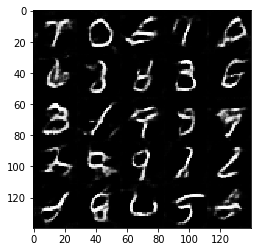

Epoch 1/5... Discriminator Loss: 1.4996... Generator Loss: 0.4210
Epoch 1/5... Discriminator Loss: 1.3196... Generator Loss: 1.7238
Epoch 1/5... Discriminator Loss: 1.4764... Generator Loss: 0.5356


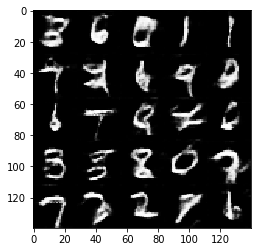

Epoch 1/5... Discriminator Loss: 1.3418... Generator Loss: 0.5763
Epoch 1/5... Discriminator Loss: 1.3502... Generator Loss: 0.5919
Epoch 1/5... Discriminator Loss: 1.7811... Generator Loss: 0.3314


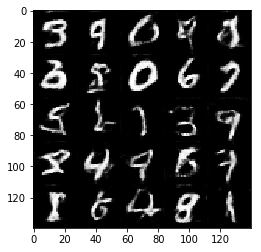

Epoch 1/5... Discriminator Loss: 1.1360... Generator Loss: 1.2623
Epoch 1/5... Discriminator Loss: 0.9113... Generator Loss: 1.7579
Epoch 1/5... Discriminator Loss: 1.0493... Generator Loss: 0.8105


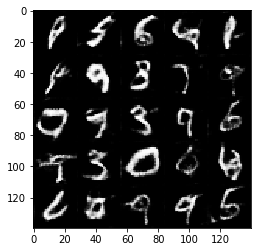

Epoch 1/5... Discriminator Loss: 2.1651... Generator Loss: 0.2852
Epoch 1/5... Discriminator Loss: 1.3004... Generator Loss: 0.6308
Epoch 1/5... Discriminator Loss: 1.0404... Generator Loss: 0.8623


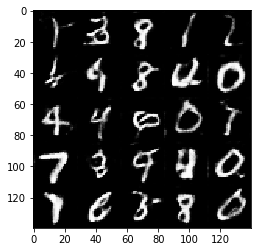

Epoch 2/5... Discriminator Loss: 1.5926... Generator Loss: 0.4306
Epoch 2/5... Discriminator Loss: 0.8935... Generator Loss: 1.0446
Epoch 2/5... Discriminator Loss: 1.0784... Generator Loss: 1.5408


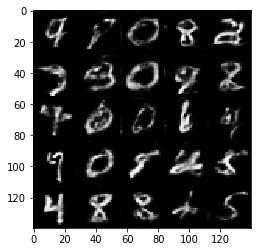

Epoch 2/5... Discriminator Loss: 1.1100... Generator Loss: 0.8686
Epoch 2/5... Discriminator Loss: 1.5943... Generator Loss: 0.4951
Epoch 2/5... Discriminator Loss: 0.8539... Generator Loss: 1.2168


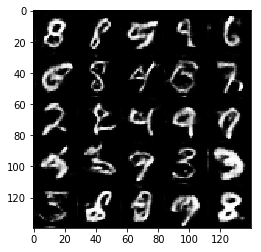

Epoch 2/5... Discriminator Loss: 1.4351... Generator Loss: 0.5385
Epoch 2/5... Discriminator Loss: 1.1386... Generator Loss: 0.7450
Epoch 2/5... Discriminator Loss: 1.1628... Generator Loss: 3.0591


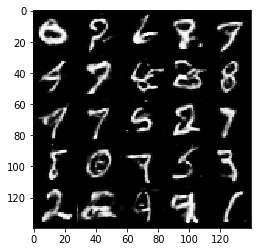

Epoch 2/5... Discriminator Loss: 1.6429... Generator Loss: 0.4732
Epoch 2/5... Discriminator Loss: 2.0066... Generator Loss: 0.3200
Epoch 2/5... Discriminator Loss: 0.5862... Generator Loss: 2.0113


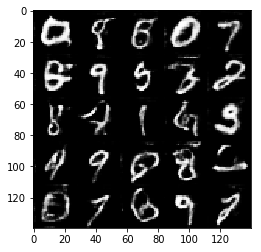

Epoch 2/5... Discriminator Loss: 0.8126... Generator Loss: 1.8631
Epoch 2/5... Discriminator Loss: 0.8586... Generator Loss: 1.1631
Epoch 2/5... Discriminator Loss: 0.6915... Generator Loss: 1.4846


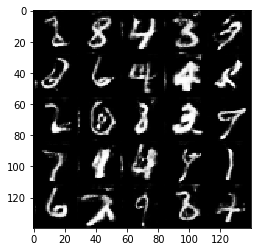

Epoch 2/5... Discriminator Loss: 0.5411... Generator Loss: 2.6178
Epoch 2/5... Discriminator Loss: 0.8296... Generator Loss: 1.1814
Epoch 2/5... Discriminator Loss: 0.9399... Generator Loss: 1.5258


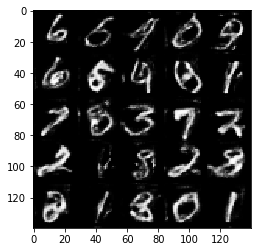

Epoch 2/5... Discriminator Loss: 0.9933... Generator Loss: 1.0041
Epoch 3/5... Discriminator Loss: 0.7851... Generator Loss: 1.3449
Epoch 3/5... Discriminator Loss: 1.2686... Generator Loss: 1.0079


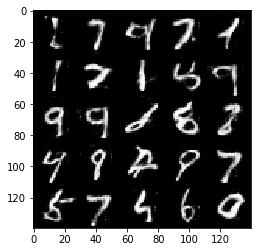

Epoch 3/5... Discriminator Loss: 1.1749... Generator Loss: 0.7278
Epoch 3/5... Discriminator Loss: 0.9865... Generator Loss: 0.9049
Epoch 3/5... Discriminator Loss: 1.3247... Generator Loss: 0.7017


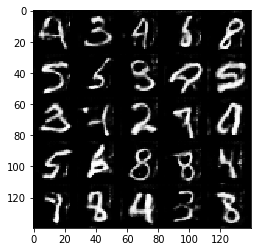

Epoch 3/5... Discriminator Loss: 0.7689... Generator Loss: 1.4372
Epoch 3/5... Discriminator Loss: 1.1200... Generator Loss: 1.8290
Epoch 3/5... Discriminator Loss: 1.1547... Generator Loss: 0.7969


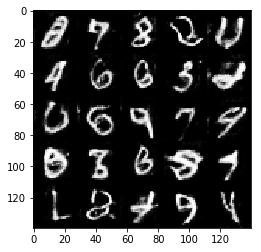

Epoch 3/5... Discriminator Loss: 1.8983... Generator Loss: 0.3645
Epoch 3/5... Discriminator Loss: 0.9816... Generator Loss: 1.0182
Epoch 3/5... Discriminator Loss: 1.2486... Generator Loss: 0.6931


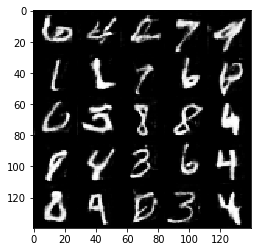

Epoch 3/5... Discriminator Loss: 0.7857... Generator Loss: 1.4537
Epoch 3/5... Discriminator Loss: 1.2018... Generator Loss: 0.7819
Epoch 3/5... Discriminator Loss: 1.0721... Generator Loss: 1.0170


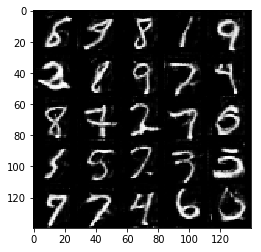

Epoch 3/5... Discriminator Loss: 0.5054... Generator Loss: 2.4252
Epoch 3/5... Discriminator Loss: 0.6584... Generator Loss: 2.0497
Epoch 3/5... Discriminator Loss: 0.5983... Generator Loss: 1.8943


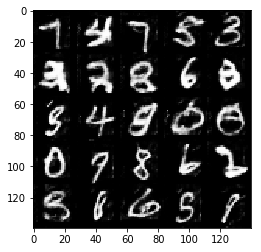

Epoch 3/5... Discriminator Loss: 1.1914... Generator Loss: 0.7479
Epoch 3/5... Discriminator Loss: 1.3736... Generator Loss: 0.5403
Epoch 4/5... Discriminator Loss: 1.1170... Generator Loss: 1.1806


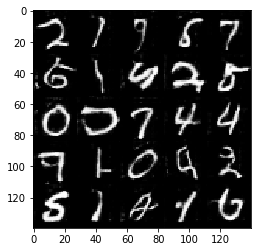

Epoch 4/5... Discriminator Loss: 0.7110... Generator Loss: 1.4307
Epoch 4/5... Discriminator Loss: 0.6508... Generator Loss: 1.5725
Epoch 4/5... Discriminator Loss: 1.0832... Generator Loss: 0.8286


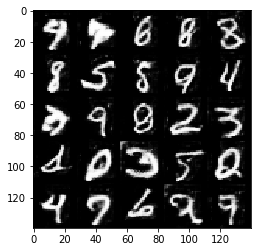

Epoch 4/5... Discriminator Loss: 1.0048... Generator Loss: 0.9556
Epoch 4/5... Discriminator Loss: 0.6600... Generator Loss: 1.7133
Epoch 4/5... Discriminator Loss: 1.4156... Generator Loss: 0.6148


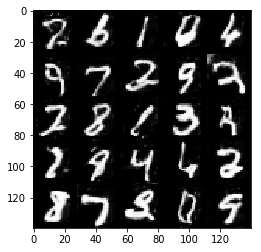

Epoch 4/5... Discriminator Loss: 0.6841... Generator Loss: 1.4927
Epoch 4/5... Discriminator Loss: 0.9201... Generator Loss: 1.0866
Epoch 4/5... Discriminator Loss: 1.0312... Generator Loss: 0.7939


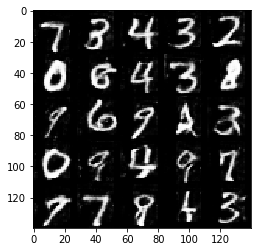

Epoch 4/5... Discriminator Loss: 1.1876... Generator Loss: 0.8298
Epoch 4/5... Discriminator Loss: 0.8241... Generator Loss: 1.3709
Epoch 4/5... Discriminator Loss: 0.7704... Generator Loss: 1.5858


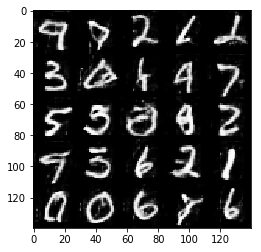

Epoch 4/5... Discriminator Loss: 0.4808... Generator Loss: 2.4169
Epoch 4/5... Discriminator Loss: 0.7020... Generator Loss: 1.4106
Epoch 4/5... Discriminator Loss: 0.7575... Generator Loss: 1.3737


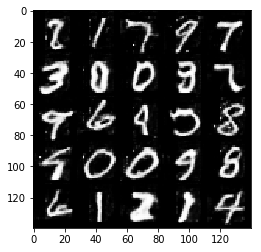

Epoch 4/5... Discriminator Loss: 1.1249... Generator Loss: 0.9485
Epoch 4/5... Discriminator Loss: 0.9791... Generator Loss: 1.2940
Epoch 4/5... Discriminator Loss: 0.9440... Generator Loss: 0.9874


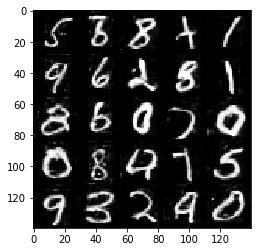

Epoch 5/5... Discriminator Loss: 0.8201... Generator Loss: 1.1200
Epoch 5/5... Discriminator Loss: 0.9045... Generator Loss: 1.0710
Epoch 5/5... Discriminator Loss: 1.5557... Generator Loss: 0.4696


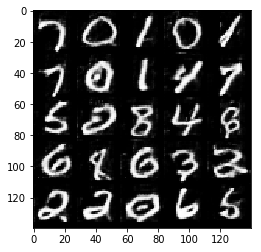

Epoch 5/5... Discriminator Loss: 1.3023... Generator Loss: 0.6649
Epoch 5/5... Discriminator Loss: 0.7892... Generator Loss: 1.3535
Epoch 5/5... Discriminator Loss: 0.9954... Generator Loss: 0.9103


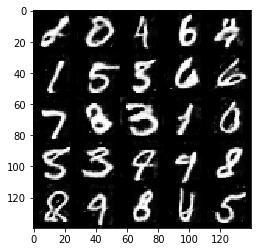

Epoch 5/5... Discriminator Loss: 0.8547... Generator Loss: 1.0531
Epoch 5/5... Discriminator Loss: 0.8196... Generator Loss: 1.2945
Epoch 5/5... Discriminator Loss: 0.5886... Generator Loss: 1.9970


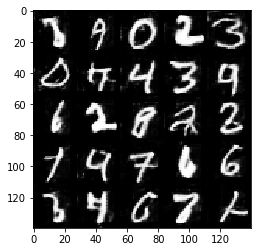

Epoch 5/5... Discriminator Loss: 0.6948... Generator Loss: 1.4443
Epoch 5/5... Discriminator Loss: 0.5704... Generator Loss: 2.0481
Epoch 5/5... Discriminator Loss: 1.4283... Generator Loss: 0.7905


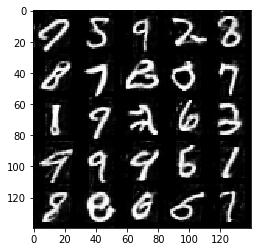

Epoch 5/5... Discriminator Loss: 2.9949... Generator Loss: 0.1581
Epoch 5/5... Discriminator Loss: 0.6078... Generator Loss: 1.7814
Epoch 5/5... Discriminator Loss: 0.6022... Generator Loss: 1.6943


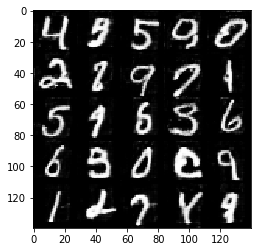

Epoch 5/5... Discriminator Loss: 0.4124... Generator Loss: 3.3664
Epoch 5/5... Discriminator Loss: 0.6271... Generator Loss: 1.6765
Epoch 5/5... Discriminator Loss: 0.7439... Generator Loss: 3.6138


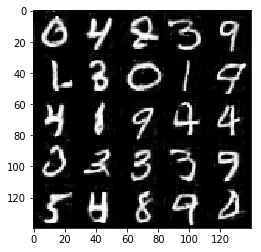

In [12]:
batch_size = 32
z_dim = 128
learning_rate = 0.001
beta1 = 0.4


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 1.0823... Generator Loss: 1.3621
Epoch 1/5... Discriminator Loss: 1.5726... Generator Loss: 0.6786
Epoch 1/5... Discriminator Loss: 1.5652... Generator Loss: 0.5796


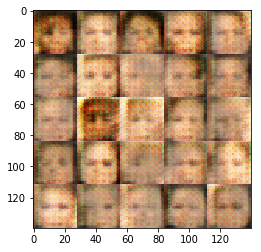

Epoch 1/5... Discriminator Loss: 1.3913... Generator Loss: 0.7273
Epoch 1/5... Discriminator Loss: 1.5084... Generator Loss: 0.6544
Epoch 1/5... Discriminator Loss: 1.5179... Generator Loss: 0.8909


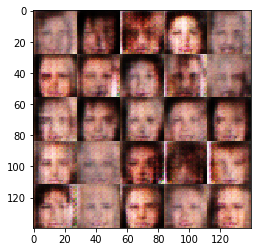

Epoch 1/5... Discriminator Loss: 1.5502... Generator Loss: 0.8296
Epoch 1/5... Discriminator Loss: 1.4568... Generator Loss: 0.7169
Epoch 1/5... Discriminator Loss: 1.3041... Generator Loss: 0.6954


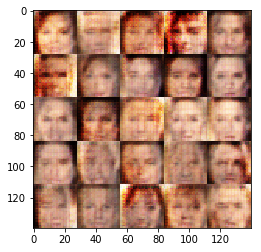

Epoch 1/5... Discriminator Loss: 1.5503... Generator Loss: 1.1155
Epoch 1/5... Discriminator Loss: 1.5038... Generator Loss: 0.9333
Epoch 1/5... Discriminator Loss: 1.3414... Generator Loss: 0.8291


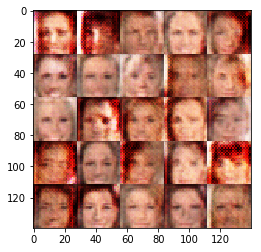

Epoch 1/5... Discriminator Loss: 1.3133... Generator Loss: 0.8528
Epoch 1/5... Discriminator Loss: 1.4615... Generator Loss: 0.8086
Epoch 1/5... Discriminator Loss: 1.3913... Generator Loss: 0.7876


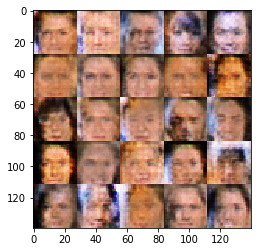

Epoch 1/5... Discriminator Loss: 1.4051... Generator Loss: 0.7673
Epoch 1/5... Discriminator Loss: 1.4446... Generator Loss: 0.6006
Epoch 1/5... Discriminator Loss: 1.4557... Generator Loss: 0.8434


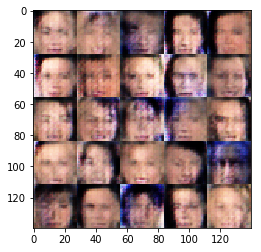

Epoch 1/5... Discriminator Loss: 1.4522... Generator Loss: 0.7416
Epoch 1/5... Discriminator Loss: 1.5474... Generator Loss: 0.7347
Epoch 1/5... Discriminator Loss: 1.4087... Generator Loss: 0.6859


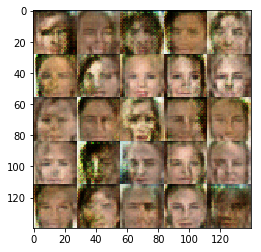

Epoch 1/5... Discriminator Loss: 1.4214... Generator Loss: 0.9240
Epoch 1/5... Discriminator Loss: 1.4280... Generator Loss: 0.9146
Epoch 1/5... Discriminator Loss: 1.3394... Generator Loss: 0.8028


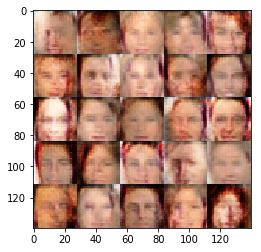

Epoch 1/5... Discriminator Loss: 1.4176... Generator Loss: 0.6556
Epoch 1/5... Discriminator Loss: 1.3764... Generator Loss: 0.7776
Epoch 1/5... Discriminator Loss: 1.2794... Generator Loss: 0.7694


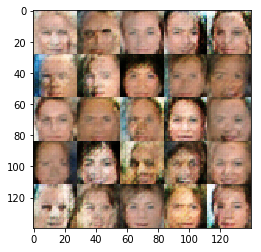

Epoch 1/5... Discriminator Loss: 1.3535... Generator Loss: 0.7606
Epoch 1/5... Discriminator Loss: 1.3268... Generator Loss: 0.7541
Epoch 1/5... Discriminator Loss: 1.3554... Generator Loss: 0.6430


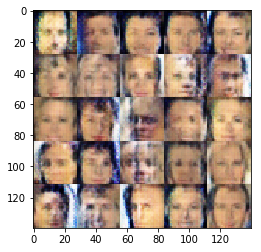

Epoch 1/5... Discriminator Loss: 1.3639... Generator Loss: 0.9643
Epoch 1/5... Discriminator Loss: 1.3220... Generator Loss: 0.9930
Epoch 1/5... Discriminator Loss: 1.3971... Generator Loss: 0.7411


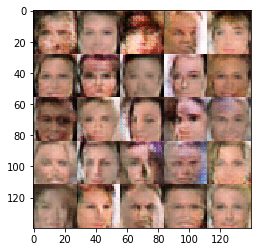

Epoch 1/5... Discriminator Loss: 1.3095... Generator Loss: 0.8228
Epoch 1/5... Discriminator Loss: 1.3460... Generator Loss: 0.8040
Epoch 1/5... Discriminator Loss: 1.4027... Generator Loss: 0.6524


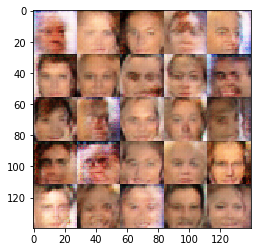

Epoch 1/5... Discriminator Loss: 1.3157... Generator Loss: 0.8294
Epoch 1/5... Discriminator Loss: 1.4394... Generator Loss: 0.6762
Epoch 1/5... Discriminator Loss: 1.4323... Generator Loss: 0.8376


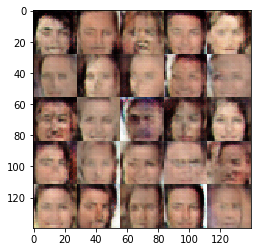

Epoch 1/5... Discriminator Loss: 1.3944... Generator Loss: 0.6658
Epoch 1/5... Discriminator Loss: 1.2791... Generator Loss: 0.8563
Epoch 1/5... Discriminator Loss: 1.5191... Generator Loss: 0.5201


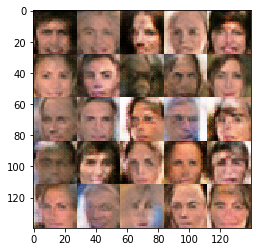

Epoch 1/5... Discriminator Loss: 1.3454... Generator Loss: 0.8687
Epoch 1/5... Discriminator Loss: 1.2468... Generator Loss: 0.8725
Epoch 1/5... Discriminator Loss: 1.3718... Generator Loss: 0.9006


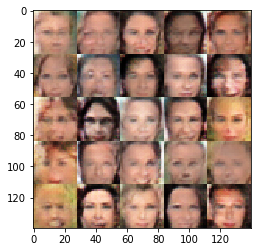

Epoch 1/5... Discriminator Loss: 1.3718... Generator Loss: 0.6751
Epoch 1/5... Discriminator Loss: 1.3425... Generator Loss: 0.9324
Epoch 1/5... Discriminator Loss: 1.2611... Generator Loss: 0.8722


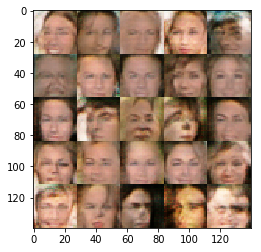

Epoch 1/5... Discriminator Loss: 1.2639... Generator Loss: 0.7697
Epoch 1/5... Discriminator Loss: 1.3299... Generator Loss: 0.7292
Epoch 1/5... Discriminator Loss: 1.2874... Generator Loss: 0.7537


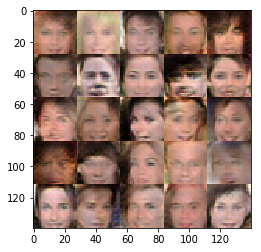

Epoch 1/5... Discriminator Loss: 1.4333... Generator Loss: 0.7847
Epoch 1/5... Discriminator Loss: 1.3636... Generator Loss: 0.8246
Epoch 1/5... Discriminator Loss: 1.2983... Generator Loss: 0.8206


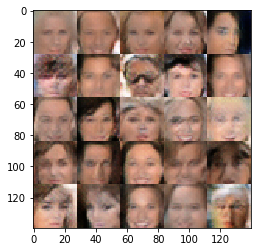

Epoch 1/5... Discriminator Loss: 1.3671... Generator Loss: 0.7549
Epoch 1/5... Discriminator Loss: 1.3158... Generator Loss: 0.6910
Epoch 1/5... Discriminator Loss: 1.3924... Generator Loss: 0.6628


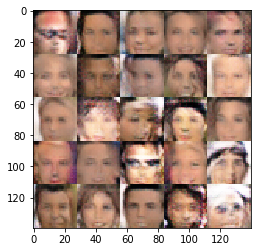

Epoch 1/5... Discriminator Loss: 1.5411... Generator Loss: 0.5949
Epoch 1/5... Discriminator Loss: 1.4013... Generator Loss: 0.9371
Epoch 1/5... Discriminator Loss: 1.4214... Generator Loss: 0.6750


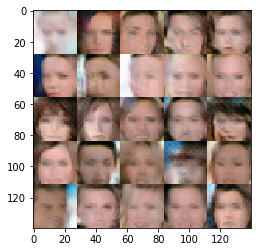

Epoch 1/5... Discriminator Loss: 1.3947... Generator Loss: 0.9386
Epoch 1/5... Discriminator Loss: 1.3240... Generator Loss: 0.9595
Epoch 1/5... Discriminator Loss: 1.4261... Generator Loss: 0.8592


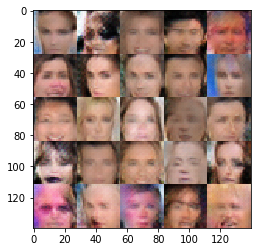

Epoch 2/5... Discriminator Loss: 1.2485... Generator Loss: 0.8476
Epoch 2/5... Discriminator Loss: 1.2966... Generator Loss: 0.7887
Epoch 2/5... Discriminator Loss: 1.3043... Generator Loss: 0.8253


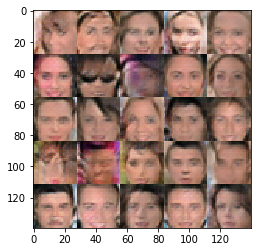

Epoch 2/5... Discriminator Loss: 1.4343... Generator Loss: 0.6338
Epoch 2/5... Discriminator Loss: 1.3170... Generator Loss: 0.7047
Epoch 2/5... Discriminator Loss: 1.3842... Generator Loss: 0.7185


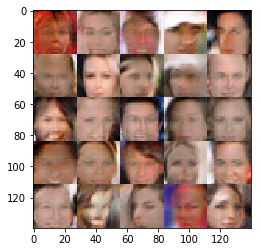

Epoch 2/5... Discriminator Loss: 1.4050... Generator Loss: 0.6945
Epoch 2/5... Discriminator Loss: 1.3201... Generator Loss: 0.7381
Epoch 2/5... Discriminator Loss: 1.3461... Generator Loss: 0.7780


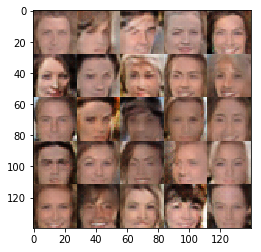

Epoch 2/5... Discriminator Loss: 1.3004... Generator Loss: 0.7660
Epoch 2/5... Discriminator Loss: 1.3628... Generator Loss: 0.7588
Epoch 2/5... Discriminator Loss: 1.3599... Generator Loss: 0.8001


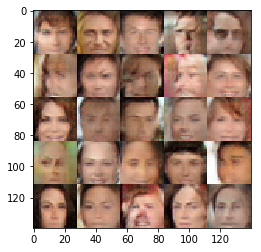

Epoch 2/5... Discriminator Loss: 1.3328... Generator Loss: 0.7367
Epoch 2/5... Discriminator Loss: 1.2945... Generator Loss: 0.8907
Epoch 2/5... Discriminator Loss: 1.3061... Generator Loss: 0.8172


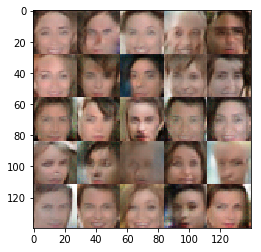

Epoch 2/5... Discriminator Loss: 1.3812... Generator Loss: 0.7281
Epoch 2/5... Discriminator Loss: 1.3708... Generator Loss: 0.6828
Epoch 2/5... Discriminator Loss: 1.3281... Generator Loss: 0.7992


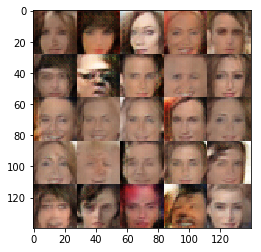

Epoch 2/5... Discriminator Loss: 1.3427... Generator Loss: 0.7037
Epoch 2/5... Discriminator Loss: 1.3993... Generator Loss: 0.7482
Epoch 2/5... Discriminator Loss: 1.2985... Generator Loss: 0.8161


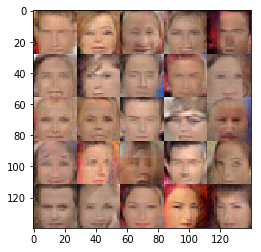

Epoch 2/5... Discriminator Loss: 1.3738... Generator Loss: 0.7201
Epoch 2/5... Discriminator Loss: 1.3215... Generator Loss: 0.7366
Epoch 2/5... Discriminator Loss: 1.3698... Generator Loss: 0.6938


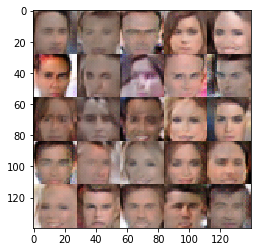

Epoch 2/5... Discriminator Loss: 1.3967... Generator Loss: 0.7196
Epoch 2/5... Discriminator Loss: 1.3026... Generator Loss: 0.7660
Epoch 2/5... Discriminator Loss: 1.3133... Generator Loss: 0.7898


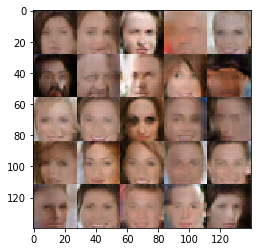

Epoch 2/5... Discriminator Loss: 1.4197... Generator Loss: 0.6604
Epoch 2/5... Discriminator Loss: 1.2780... Generator Loss: 0.7670
Epoch 2/5... Discriminator Loss: 1.3167... Generator Loss: 0.7541


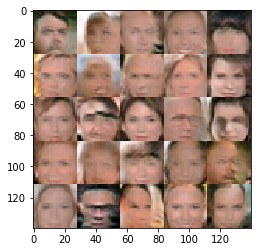

Epoch 2/5... Discriminator Loss: 1.3664... Generator Loss: 0.6873
Epoch 2/5... Discriminator Loss: 1.4423... Generator Loss: 0.6785
Epoch 2/5... Discriminator Loss: 1.3241... Generator Loss: 0.7609


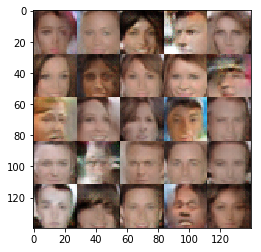

Epoch 2/5... Discriminator Loss: 1.3748... Generator Loss: 0.7046
Epoch 2/5... Discriminator Loss: 1.4542... Generator Loss: 0.7905
Epoch 2/5... Discriminator Loss: 1.3360... Generator Loss: 0.8154


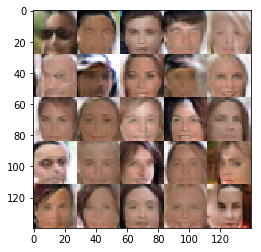

Epoch 2/5... Discriminator Loss: 1.3162... Generator Loss: 0.7592
Epoch 2/5... Discriminator Loss: 1.4127... Generator Loss: 0.6907
Epoch 2/5... Discriminator Loss: 1.3452... Generator Loss: 0.7713


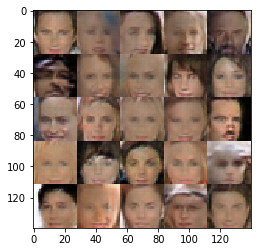

Epoch 2/5... Discriminator Loss: 1.3023... Generator Loss: 0.8183
Epoch 2/5... Discriminator Loss: 1.2882... Generator Loss: 0.7845
Epoch 2/5... Discriminator Loss: 1.3380... Generator Loss: 0.7537


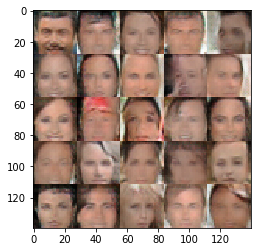

Epoch 2/5... Discriminator Loss: 1.3607... Generator Loss: 0.7020
Epoch 2/5... Discriminator Loss: 1.3231... Generator Loss: 0.8150
Epoch 2/5... Discriminator Loss: 1.2594... Generator Loss: 0.8971


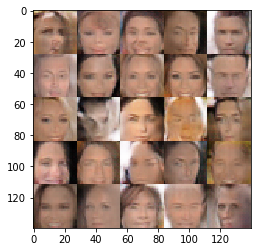

Epoch 2/5... Discriminator Loss: 1.2450... Generator Loss: 0.8760
Epoch 2/5... Discriminator Loss: 1.3926... Generator Loss: 0.7537
Epoch 2/5... Discriminator Loss: 1.3687... Generator Loss: 0.7235


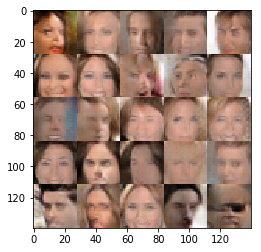

Epoch 2/5... Discriminator Loss: 1.3890... Generator Loss: 0.7206
Epoch 2/5... Discriminator Loss: 1.4111... Generator Loss: 0.6950
Epoch 2/5... Discriminator Loss: 1.3083... Generator Loss: 0.7893


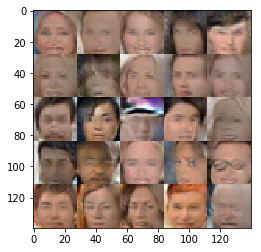

Epoch 2/5... Discriminator Loss: 1.3425... Generator Loss: 0.7210
Epoch 2/5... Discriminator Loss: 1.3081... Generator Loss: 0.8358
Epoch 2/5... Discriminator Loss: 1.3052... Generator Loss: 0.7345


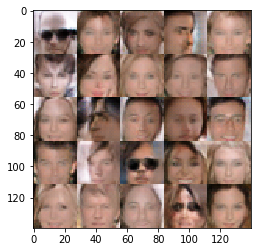

Epoch 2/5... Discriminator Loss: 1.3373... Generator Loss: 0.6949
Epoch 2/5... Discriminator Loss: 1.2522... Generator Loss: 0.7589
Epoch 2/5... Discriminator Loss: 1.2808... Generator Loss: 0.7683


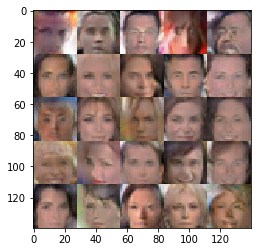

Epoch 2/5... Discriminator Loss: 1.3430... Generator Loss: 0.7462
Epoch 2/5... Discriminator Loss: 1.3037... Generator Loss: 0.7716
Epoch 2/5... Discriminator Loss: 1.3199... Generator Loss: 0.8844


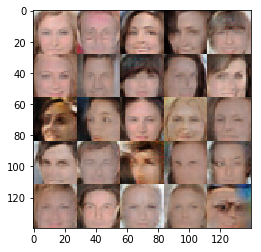

Epoch 2/5... Discriminator Loss: 1.2281... Generator Loss: 0.9412
Epoch 2/5... Discriminator Loss: 1.2735... Generator Loss: 0.8863
Epoch 2/5... Discriminator Loss: 1.3946... Generator Loss: 0.6864


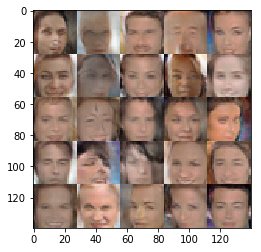

Epoch 3/5... Discriminator Loss: 1.1325... Generator Loss: 0.8663
Epoch 3/5... Discriminator Loss: 1.2373... Generator Loss: 0.7738
Epoch 3/5... Discriminator Loss: 1.4755... Generator Loss: 0.6724


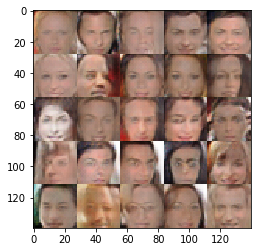

Epoch 3/5... Discriminator Loss: 1.3236... Generator Loss: 0.6718
Epoch 3/5... Discriminator Loss: 1.2227... Generator Loss: 0.7747
Epoch 3/5... Discriminator Loss: 1.1787... Generator Loss: 0.9551


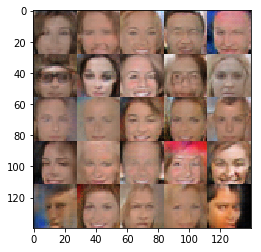

Epoch 3/5... Discriminator Loss: 1.3270... Generator Loss: 0.7535
Epoch 3/5... Discriminator Loss: 1.3306... Generator Loss: 0.7358
Epoch 3/5... Discriminator Loss: 1.3051... Generator Loss: 0.8197


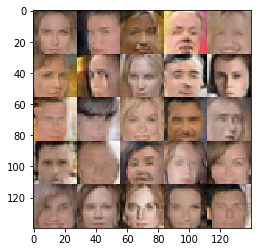

Epoch 3/5... Discriminator Loss: 1.4412... Generator Loss: 0.6107
Epoch 3/5... Discriminator Loss: 1.3066... Generator Loss: 0.7547
Epoch 3/5... Discriminator Loss: 1.2511... Generator Loss: 0.8427


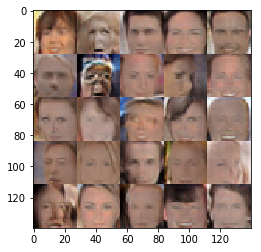

Epoch 3/5... Discriminator Loss: 1.3475... Generator Loss: 0.6973
Epoch 3/5... Discriminator Loss: 1.2633... Generator Loss: 0.8689
Epoch 3/5... Discriminator Loss: 1.3065... Generator Loss: 0.7801


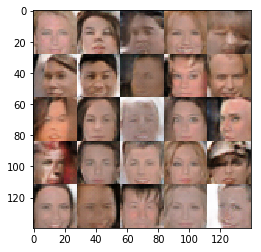

Epoch 3/5... Discriminator Loss: 1.1831... Generator Loss: 0.9112
Epoch 3/5... Discriminator Loss: 1.2756... Generator Loss: 0.7824
Epoch 3/5... Discriminator Loss: 1.3749... Generator Loss: 0.7633


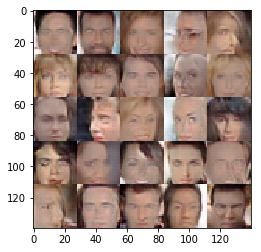

Epoch 3/5... Discriminator Loss: 1.3022... Generator Loss: 0.8350
Epoch 3/5... Discriminator Loss: 1.3033... Generator Loss: 0.7356
Epoch 3/5... Discriminator Loss: 1.3317... Generator Loss: 0.8051


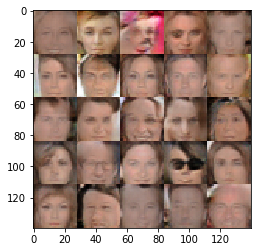

Epoch 3/5... Discriminator Loss: 1.3384... Generator Loss: 0.7626
Epoch 3/5... Discriminator Loss: 1.3734... Generator Loss: 0.7403
Epoch 3/5... Discriminator Loss: 1.2601... Generator Loss: 0.7911


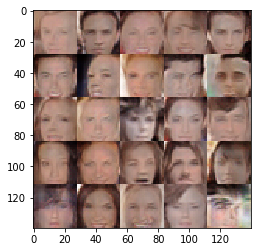

Epoch 3/5... Discriminator Loss: 1.3958... Generator Loss: 0.7923
Epoch 3/5... Discriminator Loss: 1.3345... Generator Loss: 0.6736
Epoch 3/5... Discriminator Loss: 1.2828... Generator Loss: 0.7313


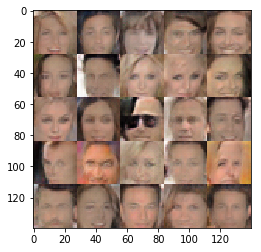

Epoch 3/5... Discriminator Loss: 1.3685... Generator Loss: 0.7384
Epoch 3/5... Discriminator Loss: 1.2975... Generator Loss: 0.7082
Epoch 3/5... Discriminator Loss: 1.2682... Generator Loss: 0.9001


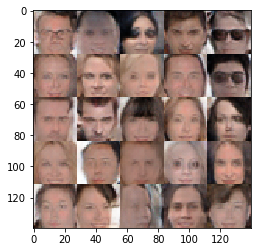

Epoch 3/5... Discriminator Loss: 1.3655... Generator Loss: 0.7199
Epoch 3/5... Discriminator Loss: 1.3453... Generator Loss: 0.7562
Epoch 3/5... Discriminator Loss: 1.2154... Generator Loss: 0.8055


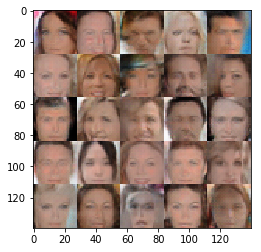

Epoch 3/5... Discriminator Loss: 1.3673... Generator Loss: 0.7181
Epoch 3/5... Discriminator Loss: 1.4231... Generator Loss: 0.6657
Epoch 3/5... Discriminator Loss: 1.3926... Generator Loss: 0.6790


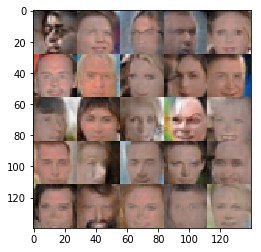

Epoch 3/5... Discriminator Loss: 1.3784... Generator Loss: 0.7635
Epoch 3/5... Discriminator Loss: 1.3313... Generator Loss: 0.7663
Epoch 3/5... Discriminator Loss: 1.3190... Generator Loss: 0.7339


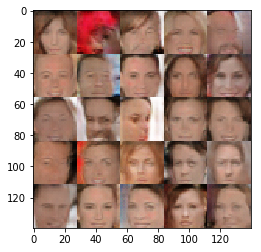

Epoch 3/5... Discriminator Loss: 1.3944... Generator Loss: 0.5601
Epoch 3/5... Discriminator Loss: 1.3586... Generator Loss: 0.7405
Epoch 3/5... Discriminator Loss: 1.4074... Generator Loss: 0.6331


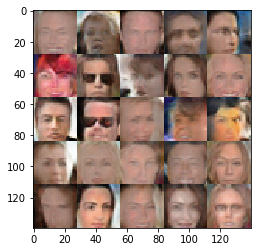

Epoch 3/5... Discriminator Loss: 1.3646... Generator Loss: 0.7978
Epoch 3/5... Discriminator Loss: 1.3453... Generator Loss: 0.7314
Epoch 3/5... Discriminator Loss: 1.3931... Generator Loss: 0.6961


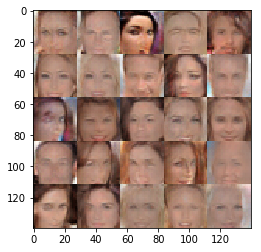

Epoch 3/5... Discriminator Loss: 1.3096... Generator Loss: 0.8151
Epoch 3/5... Discriminator Loss: 1.1810... Generator Loss: 0.8809
Epoch 3/5... Discriminator Loss: 1.1776... Generator Loss: 0.9279


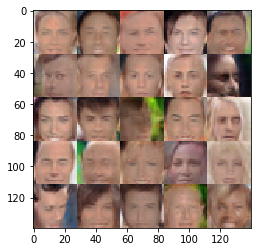

Epoch 3/5... Discriminator Loss: 1.2260... Generator Loss: 0.7559
Epoch 3/5... Discriminator Loss: 1.2273... Generator Loss: 0.8766
Epoch 3/5... Discriminator Loss: 1.3951... Generator Loss: 0.6594


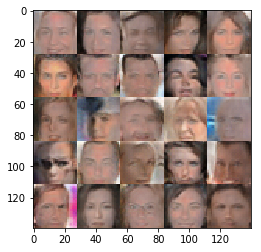

Epoch 3/5... Discriminator Loss: 1.3937... Generator Loss: 0.6950
Epoch 3/5... Discriminator Loss: 1.2819... Generator Loss: 0.7675
Epoch 3/5... Discriminator Loss: 1.4116... Generator Loss: 0.7395


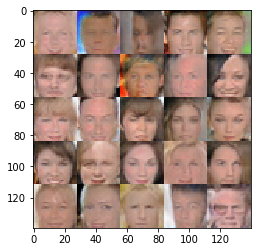

Epoch 3/5... Discriminator Loss: 1.2859... Generator Loss: 0.8635
Epoch 3/5... Discriminator Loss: 1.3622... Generator Loss: 0.7505
Epoch 3/5... Discriminator Loss: 1.4399... Generator Loss: 0.6457


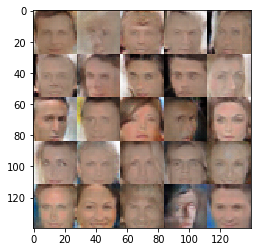

Epoch 3/5... Discriminator Loss: 1.3629... Generator Loss: 0.7318
Epoch 3/5... Discriminator Loss: 1.2508... Generator Loss: 0.9195
Epoch 3/5... Discriminator Loss: 1.3412... Generator Loss: 0.6766


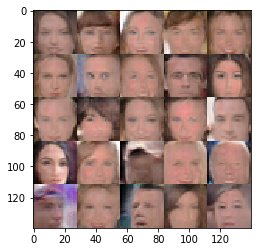

Epoch 3/5... Discriminator Loss: 1.1738... Generator Loss: 0.8859
Epoch 3/5... Discriminator Loss: 1.3137... Generator Loss: 0.6762
Epoch 3/5... Discriminator Loss: 1.3393... Generator Loss: 0.7410


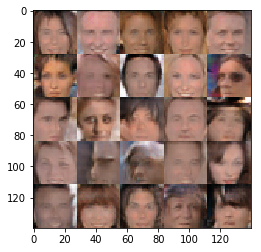

Epoch 4/5... Discriminator Loss: 1.3250... Generator Loss: 0.7585
Epoch 4/5... Discriminator Loss: 1.4185... Generator Loss: 0.7808
Epoch 4/5... Discriminator Loss: 1.2282... Generator Loss: 0.8124


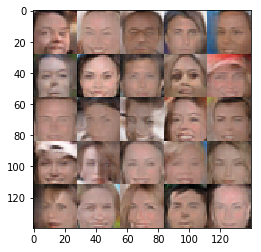

Epoch 4/5... Discriminator Loss: 1.2158... Generator Loss: 0.7702
Epoch 4/5... Discriminator Loss: 1.3133... Generator Loss: 0.7286
Epoch 4/5... Discriminator Loss: 1.3353... Generator Loss: 0.6562


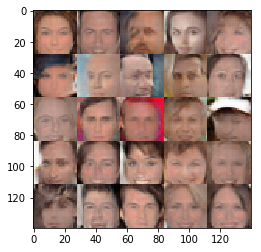

Epoch 4/5... Discriminator Loss: 1.3416... Generator Loss: 0.7886
Epoch 4/5... Discriminator Loss: 1.2951... Generator Loss: 0.7025
Epoch 4/5... Discriminator Loss: 1.2343... Generator Loss: 0.8301


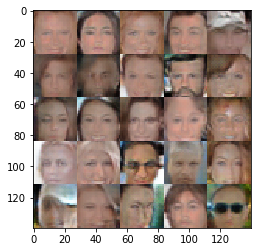

Epoch 4/5... Discriminator Loss: 1.3536... Generator Loss: 0.5993
Epoch 4/5... Discriminator Loss: 1.2628... Generator Loss: 0.7034
Epoch 4/5... Discriminator Loss: 1.3832... Generator Loss: 0.8234


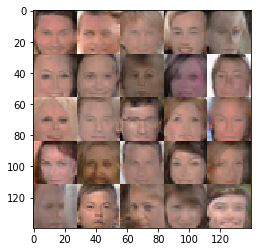

Epoch 4/5... Discriminator Loss: 1.5871... Generator Loss: 0.5604
Epoch 4/5... Discriminator Loss: 1.4202... Generator Loss: 0.6494
Epoch 4/5... Discriminator Loss: 1.2205... Generator Loss: 0.8472


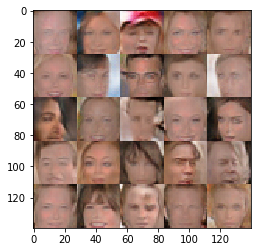

Epoch 4/5... Discriminator Loss: 1.0961... Generator Loss: 1.0562
Epoch 4/5... Discriminator Loss: 1.2510... Generator Loss: 0.7875
Epoch 4/5... Discriminator Loss: 1.3939... Generator Loss: 0.6240


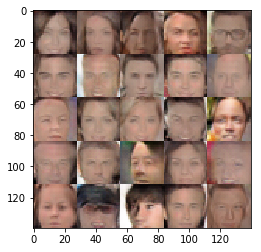

Epoch 4/5... Discriminator Loss: 1.3552... Generator Loss: 0.6732
Epoch 4/5... Discriminator Loss: 1.2721... Generator Loss: 0.8699
Epoch 4/5... Discriminator Loss: 1.3173... Generator Loss: 0.6353


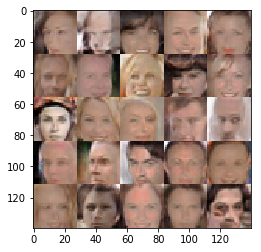

Epoch 4/5... Discriminator Loss: 1.2206... Generator Loss: 0.8475
Epoch 4/5... Discriminator Loss: 1.1160... Generator Loss: 0.9469
Epoch 4/5... Discriminator Loss: 1.2247... Generator Loss: 0.8153


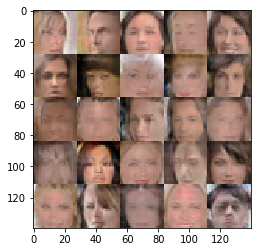

Epoch 4/5... Discriminator Loss: 1.3067... Generator Loss: 0.7866
Epoch 4/5... Discriminator Loss: 1.3107... Generator Loss: 0.6978
Epoch 4/5... Discriminator Loss: 1.2946... Generator Loss: 0.6764


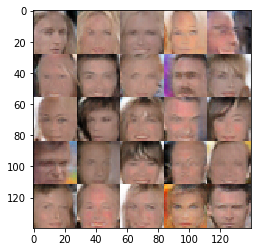

Epoch 4/5... Discriminator Loss: 1.2608... Generator Loss: 0.9118
Epoch 4/5... Discriminator Loss: 1.3354... Generator Loss: 0.8018
Epoch 4/5... Discriminator Loss: 1.2220... Generator Loss: 0.9245


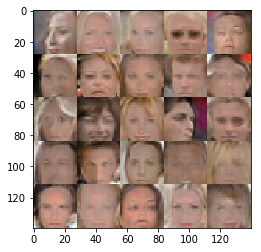

Epoch 4/5... Discriminator Loss: 1.1989... Generator Loss: 0.8731
Epoch 4/5... Discriminator Loss: 1.2025... Generator Loss: 0.8608
Epoch 4/5... Discriminator Loss: 1.2350... Generator Loss: 0.9396


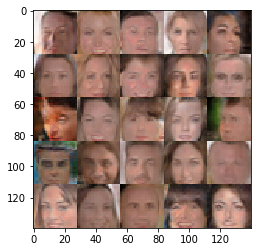

Epoch 4/5... Discriminator Loss: 1.5008... Generator Loss: 0.5899
Epoch 4/5... Discriminator Loss: 1.2704... Generator Loss: 0.7068
Epoch 4/5... Discriminator Loss: 1.3928... Generator Loss: 0.5869


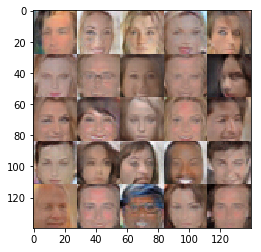

Epoch 4/5... Discriminator Loss: 1.4688... Generator Loss: 0.5266
Epoch 4/5... Discriminator Loss: 1.3139... Generator Loss: 0.7675
Epoch 4/5... Discriminator Loss: 1.3655... Generator Loss: 0.7145


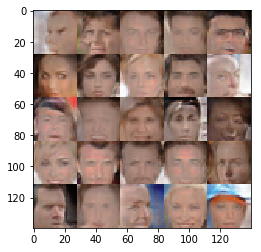

Epoch 4/5... Discriminator Loss: 1.3204... Generator Loss: 0.7577
Epoch 4/5... Discriminator Loss: 1.2054... Generator Loss: 0.8097
Epoch 4/5... Discriminator Loss: 1.2584... Generator Loss: 0.8364


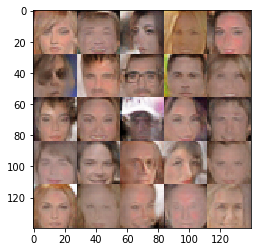

Epoch 4/5... Discriminator Loss: 1.0958... Generator Loss: 0.8918
Epoch 4/5... Discriminator Loss: 1.1548... Generator Loss: 0.9473
Epoch 4/5... Discriminator Loss: 1.3674... Generator Loss: 0.6640


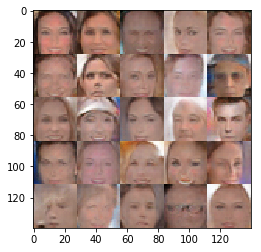

Epoch 4/5... Discriminator Loss: 1.3095... Generator Loss: 0.7748
Epoch 4/5... Discriminator Loss: 1.3760... Generator Loss: 0.6107
Epoch 4/5... Discriminator Loss: 1.2572... Generator Loss: 0.8730


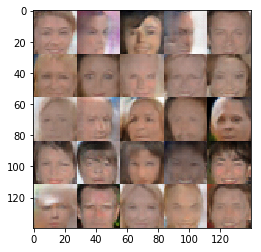

Epoch 4/5... Discriminator Loss: 1.4185... Generator Loss: 0.6494
Epoch 4/5... Discriminator Loss: 1.2774... Generator Loss: 0.7058
Epoch 4/5... Discriminator Loss: 1.0948... Generator Loss: 1.1824


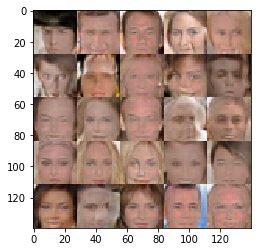

Epoch 4/5... Discriminator Loss: 1.3880... Generator Loss: 0.6569
Epoch 4/5... Discriminator Loss: 1.3101... Generator Loss: 0.6668
Epoch 4/5... Discriminator Loss: 1.1482... Generator Loss: 0.8633


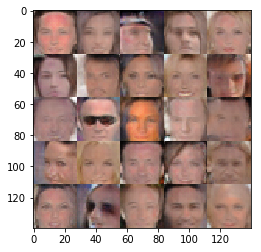

Epoch 4/5... Discriminator Loss: 1.2483... Generator Loss: 0.8766
Epoch 4/5... Discriminator Loss: 1.3109... Generator Loss: 0.7200
Epoch 4/5... Discriminator Loss: 1.3104... Generator Loss: 0.8035


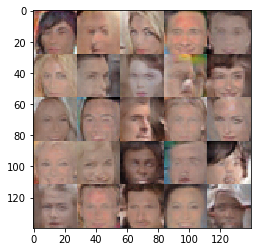

Epoch 4/5... Discriminator Loss: 1.1425... Generator Loss: 0.8644
Epoch 4/5... Discriminator Loss: 1.3792... Generator Loss: 0.5952
Epoch 4/5... Discriminator Loss: 1.2940... Generator Loss: 0.7369


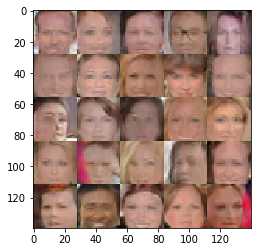

Epoch 4/5... Discriminator Loss: 1.3381... Generator Loss: 0.7367
Epoch 4/5... Discriminator Loss: 1.3438... Generator Loss: 0.7666
Epoch 4/5... Discriminator Loss: 1.3828... Generator Loss: 0.6823


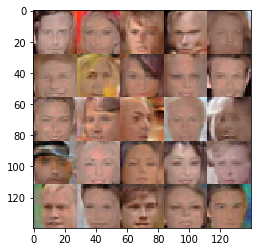

Epoch 4/5... Discriminator Loss: 1.3070... Generator Loss: 0.6924
Epoch 5/5... Discriminator Loss: 1.2833... Generator Loss: 0.7582
Epoch 5/5... Discriminator Loss: 1.3563... Generator Loss: 0.6995


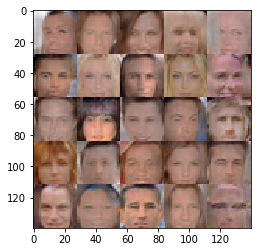

Epoch 5/5... Discriminator Loss: 1.2899... Generator Loss: 0.7241
Epoch 5/5... Discriminator Loss: 1.1962... Generator Loss: 0.8407
Epoch 5/5... Discriminator Loss: 1.4088... Generator Loss: 0.5675


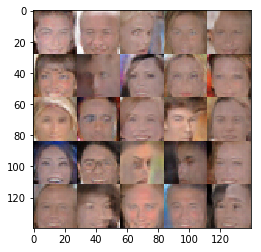

Epoch 5/5... Discriminator Loss: 1.1813... Generator Loss: 0.7315
Epoch 5/5... Discriminator Loss: 1.1526... Generator Loss: 0.8346
Epoch 5/5... Discriminator Loss: 1.2970... Generator Loss: 0.7354


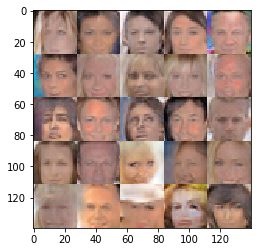

Epoch 5/5... Discriminator Loss: 1.4936... Generator Loss: 0.5401
Epoch 5/5... Discriminator Loss: 1.2723... Generator Loss: 0.6625
Epoch 5/5... Discriminator Loss: 1.1509... Generator Loss: 0.7687


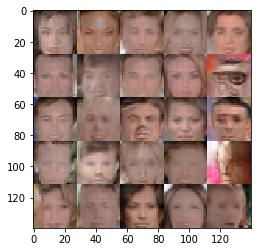

Epoch 5/5... Discriminator Loss: 1.4517... Generator Loss: 0.6137
Epoch 5/5... Discriminator Loss: 1.2090... Generator Loss: 0.7297
Epoch 5/5... Discriminator Loss: 1.3490... Generator Loss: 0.8327


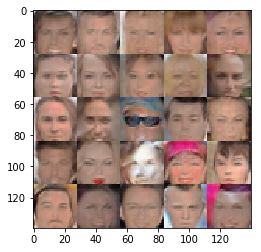

Epoch 5/5... Discriminator Loss: 1.2771... Generator Loss: 0.6286
Epoch 5/5... Discriminator Loss: 1.2637... Generator Loss: 0.8436
Epoch 5/5... Discriminator Loss: 1.2372... Generator Loss: 0.8150


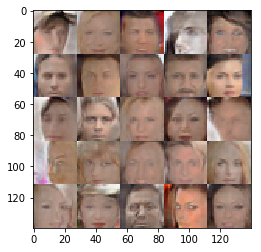

Epoch 5/5... Discriminator Loss: 1.2273... Generator Loss: 0.7221
Epoch 5/5... Discriminator Loss: 1.2302... Generator Loss: 0.8236
Epoch 5/5... Discriminator Loss: 1.3291... Generator Loss: 0.8062


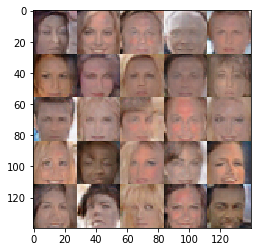

Epoch 5/5... Discriminator Loss: 1.2487... Generator Loss: 0.7563
Epoch 5/5... Discriminator Loss: 1.3160... Generator Loss: 0.7006
Epoch 5/5... Discriminator Loss: 1.1710... Generator Loss: 0.9825


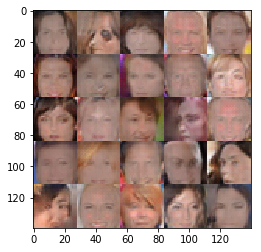

Epoch 5/5... Discriminator Loss: 1.3209... Generator Loss: 0.6828
Epoch 5/5... Discriminator Loss: 1.3899... Generator Loss: 0.6154
Epoch 5/5... Discriminator Loss: 1.2035... Generator Loss: 0.9271


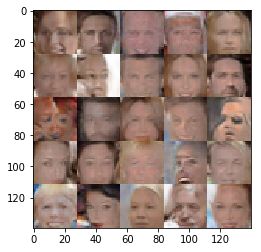

Epoch 5/5... Discriminator Loss: 1.2867... Generator Loss: 0.7764
Epoch 5/5... Discriminator Loss: 1.3874... Generator Loss: 0.6960
Epoch 5/5... Discriminator Loss: 1.1275... Generator Loss: 0.8941


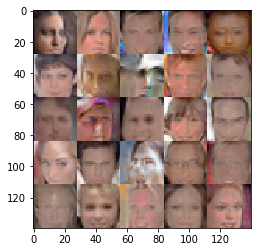

Epoch 5/5... Discriminator Loss: 1.3910... Generator Loss: 0.6510
Epoch 5/5... Discriminator Loss: 1.3595... Generator Loss: 0.6635
Epoch 5/5... Discriminator Loss: 1.4317... Generator Loss: 0.7052


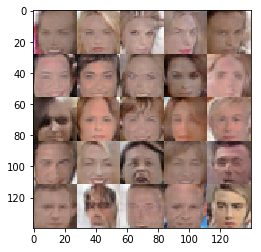

Epoch 5/5... Discriminator Loss: 1.4968... Generator Loss: 0.6079
Epoch 5/5... Discriminator Loss: 1.4394... Generator Loss: 0.5638
Epoch 5/5... Discriminator Loss: 1.4144... Generator Loss: 0.6152


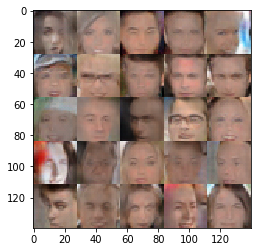

Epoch 5/5... Discriminator Loss: 1.4093... Generator Loss: 0.6634
Epoch 5/5... Discriminator Loss: 1.3397... Generator Loss: 0.7465
Epoch 5/5... Discriminator Loss: 1.1860... Generator Loss: 0.8084


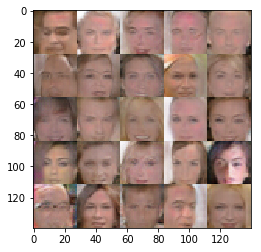

Epoch 5/5... Discriminator Loss: 1.1087... Generator Loss: 1.0229
Epoch 5/5... Discriminator Loss: 1.2964... Generator Loss: 0.6636
Epoch 5/5... Discriminator Loss: 1.2238... Generator Loss: 0.8050


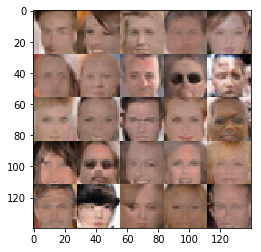

Epoch 5/5... Discriminator Loss: 1.2227... Generator Loss: 0.8114
Epoch 5/5... Discriminator Loss: 1.2985... Generator Loss: 0.7051
Epoch 5/5... Discriminator Loss: 1.0703... Generator Loss: 0.8329


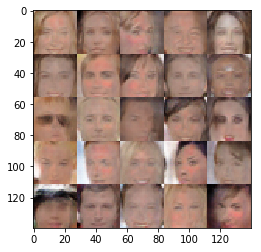

Epoch 5/5... Discriminator Loss: 1.2674... Generator Loss: 0.7594
Epoch 5/5... Discriminator Loss: 1.1448... Generator Loss: 0.8546
Epoch 5/5... Discriminator Loss: 1.3209... Generator Loss: 0.7144


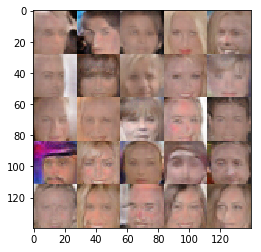

Epoch 5/5... Discriminator Loss: 1.2138... Generator Loss: 0.7437
Epoch 5/5... Discriminator Loss: 1.3052... Generator Loss: 0.5817
Epoch 5/5... Discriminator Loss: 1.5018... Generator Loss: 0.5196


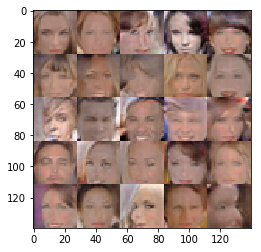

Epoch 5/5... Discriminator Loss: 1.3409... Generator Loss: 0.7468
Epoch 5/5... Discriminator Loss: 1.0877... Generator Loss: 0.8876
Epoch 5/5... Discriminator Loss: 1.1906... Generator Loss: 0.9104


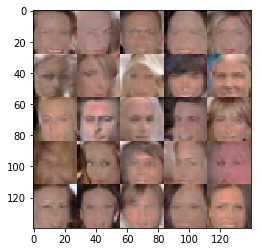

Epoch 5/5... Discriminator Loss: 1.1835... Generator Loss: 0.8796
Epoch 5/5... Discriminator Loss: 1.4213... Generator Loss: 0.6851
Epoch 5/5... Discriminator Loss: 1.1091... Generator Loss: 0.9043


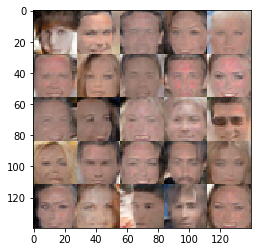

Epoch 5/5... Discriminator Loss: 1.2622... Generator Loss: 0.7249
Epoch 5/5... Discriminator Loss: 0.9040... Generator Loss: 1.2568
Epoch 5/5... Discriminator Loss: 1.3929... Generator Loss: 0.6220


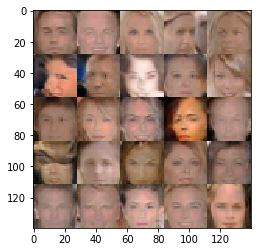

Epoch 5/5... Discriminator Loss: 1.3639... Generator Loss: 0.6387
Epoch 5/5... Discriminator Loss: 1.1389... Generator Loss: 1.0159
Epoch 5/5... Discriminator Loss: 1.2403... Generator Loss: 0.7140


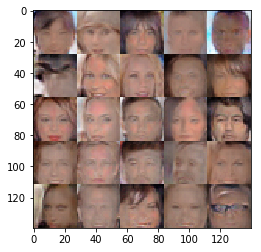

Epoch 5/5... Discriminator Loss: 1.2791... Generator Loss: 0.7914


In [13]:
batch_size = 32
z_dim = 128
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.